In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/Othercomputers/LG DX 노트북/LG_Dx_School/DCX analysis/dcx_AI 대체 관련 크롤링

/content/drive/Othercomputers/LG DX 노트북/LG_Dx_School/DCX analysis/dcx_AI 대체 관련 크롤링


In [4]:
import pandas as pd

In [5]:
df1 = pd.read_csv("geeknews_AI_articles.csv")
df2 = pd.read_csv("geeknews_AI_articles1.csv")

In [6]:
df1.shape

(1792, 4)

In [7]:
df2.shape

(131, 4)

In [8]:
df = pd.concat([df1,df2])

In [9]:
df.head()

,keyword,title,content,url
0,AI,AI로 개발을 어떻게 가속화 하는가 - 드디어 열린 입코딩 시대 [137p 구글 슬...,"프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 : ""코딩은 ...",https://news.hada.io/topic?id=22450
1,AI,Ask HN: AI에 지쳤어요. 다른 쿨한 기술들은 뭐가 있나요?,"""요즘 AI 뉴스가 대부분인데, 다른 종류의 혁신, 하드웨어, 네트워킹, 개발 도구...",https://news.hada.io/topic?id=21198
2,AI,AI 지원이 코딩 기술 형성에 미치는 영향,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,https://news.hada.io/topic?id=26275
3,AI,"두 가지 유형의 AI 사용자가 등장하고 있으며, 그 격차는 놀랍습니다","AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며, ‘파워 유저’ 는 Claud...",https://news.hada.io/topic?id=26345
4,AI,AI TOP 100이 우리에게 남긴 것들,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,https://news.hada.io/topic?id=24957


In [10]:
df.shape

(1923, 4)

In [11]:
df.to_csv("geeknews_AI.csv",index = False)

In [13]:
geek_df = pd.read_csv("geeknews_AI.csv")

In [14]:
geek_df.shape

(1923, 4)

In [23]:
geek_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1923 entries, 0 to 1922
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   keyword  1923 non-null   object
 1   title    1923 non-null   object
 2   content  1922 non-null   object
 3   url      1923 non-null   object
dtypes: object(4)
memory usage: 60.2+ KB


In [24]:
## content 에 결측값 존재!!! > 결측값 있는지 당연히 확인하기...
geek_df.dropna(inplace=True)

In [25]:
geek_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1922 entries, 0 to 1922
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   keyword  1922 non-null   object
 1   title    1922 non-null   object
 2   content  1922 non-null   object
 3   url      1922 non-null   object
dtypes: object(4)
memory usage: 75.1+ KB


In [15]:
import re

In [26]:
pattern = r'[^a-zA-Z0-9가-힣\s]'

In [27]:
new_reviews = [re.sub(pattern,"",content) for content in geek_df['content']] # 하나의 문장으로 만드는 과정

In [33]:
geek_df['review_clean'] = new_reviews

In [19]:
stopwords = pd.read_csv("ko-stopwords.csv")

In [20]:
stopwords_list = list(stopwords['stopwords'])

In [28]:
# 리뷰길이가 10개 미만인 경우 삭제
drop_index = [] # 길이가 짧은 글의 인덱스를 저장할 리스트

for i, review in enumerate(geek_df['content']): #문장 전체반복처리
    if len(review)<10:
        drop_index.append(i)
drop_index

[]

In [29]:
!pip install konlpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.4/19.4 MB 72.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 495.9/495.9 kB 31.7 MB/s eta 0:00:00


In [30]:
from konlpy.tag import Okt
okt = Okt()

In [31]:
def pos_tagging(text):
    # 형태소 단위로 분리 + 품사정보 추출
    pos_words = okt.pos(text,stem=True,norm=True) # 어간 추출 및 정규화 속성 활성화

    # 중간결과 저장리스트
    tagged_list = []
    for token, tag in pos_words:  # 한문장의 쪼개진 토큰을 반복처리
        if tag in ['Noun','Verb','Adjective']: # 명사,동사,형용사만 걸러내기
            if token not in stopwords_list: #불용어가 아닌 token만
                tagged_list.append(token)

    return tagged_list


In [34]:
geek_df

,keyword,title,content,url,review_clean
0,AI,AI로 개발을 어떻게 가속화 하는가 - 드디어 열린 입코딩 시대 [137p 구글 슬...,"프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 : ""코딩은 ...",https://news.hada.io/topic?id=22450,프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 코딩은 일부...
1,AI,Ask HN: AI에 지쳤어요. 다른 쿨한 기술들은 뭐가 있나요?,"""요즘 AI 뉴스가 대부분인데, 다른 종류의 혁신, 하드웨어, 네트워킹, 개발 도구...",https://news.hada.io/topic?id=21198,요즘 AI 뉴스가 대부분인데 다른 종류의 혁신 하드웨어 네트워킹 개발 도구 로봇 공...
2,AI,AI 지원이 코딩 기술 형성에 미치는 영향,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,https://news.hada.io/topic?id=26275,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...
3,AI,"두 가지 유형의 AI 사용자가 등장하고 있으며, 그 격차는 놀랍습니다","AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며, ‘파워 유저’ 는 Claud...",https://news.hada.io/topic?id=26345,AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며 파워 유저 는 Claude C...
4,AI,AI TOP 100이 우리에게 남긴 것들,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,https://news.hada.io/topic?id=24957,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...
...,...,...,...,...,...
1918,workflow automation,AI 시대의 새로운 개발자 패턴들,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,https://news.hada.io/topic?id=21115,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...
1919,workflow automation,"Airtable Apps,Automations,Sync 공개",스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n-...,https://news.hada.io/topic?id=2867,스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n ...
1920,workflow automation,Microsoft Amplifier - 초고속 AI 개발 환경,"전문화된 AI 에이전트, 지속적인 지식의 축적, 복잡한 방법론을 실행하는 자동화 워...",https://news.hada.io/topic?id=23672,전문화된 AI 에이전트 지속적인 지식의 축적 복잡한 방법론을 실행하는 자동화 워크플...
1921,workflow automation,n8n - 오픈소스 워크플로우 자동화 솔루션,"- 150개 이상의 앱과 연동\n- Zapier, IFTTT처럼 No-Code 플로...",https://news.hada.io/topic?id=4056,150개 이상의 앱과 연동\n Zapier IFTTT처럼 NoCode 플로우 작성...


In [35]:
geek_df['tagged_review'] = geek_df['review_clean'].apply(pos_tagging)

In [36]:
geek_df

,keyword,title,content,url,review_clean,tagged_review
0,AI,AI로 개발을 어떻게 가속화 하는가 - 드디어 열린 입코딩 시대 [137p 구글 슬...,"프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 : ""코딩은 ...",https://news.hada.io/topic?id=22450,프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 코딩은 일부...,"[프로그래머, 로서, 활용, 방법, 생산, 성은, 코딩, 오지, 않다, 코딩, 일부..."
1,AI,Ask HN: AI에 지쳤어요. 다른 쿨한 기술들은 뭐가 있나요?,"""요즘 AI 뉴스가 대부분인데, 다른 종류의 혁신, 하드웨어, 네트워킹, 개발 도구...",https://news.hada.io/topic?id=21198,요즘 AI 뉴스가 대부분인데 다른 종류의 혁신 하드웨어 네트워킹 개발 도구 로봇 공...,"[요즘, 뉴스, 대부분, 종류, 혁신, 하드웨어, 네트워킹, 개발, 도구, 로봇, ..."
2,AI,AI 지원이 코딩 기술 형성에 미치는 영향,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,https://news.hada.io/topic?id=26275,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,"[앤트로픽, 코딩, 도우미, 사용, 개발자, 학습, 숙련, 도, 영향, 주다, 실험..."
3,AI,"두 가지 유형의 AI 사용자가 등장하고 있으며, 그 격차는 놀랍습니다","AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며, ‘파워 유저’ 는 Claud...",https://news.hada.io/topic?id=26345,AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며 파워 유저 는 Claude C...,"[사용자, 간, 생산, 격차, 급격하다, 벌어지다, 파워, 유저, 늘다, 고급, 도..."
4,AI,AI TOP 100이 우리에게 남긴 것들,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,https://news.hada.io/topic?id=24957,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,"[총, 상금, 겨루다, 경진, 대회, 용, 시스템, 준비, 카카오, 멤버, 다양하다..."
...,...,...,...,...,...,...
1918,workflow automation,AI 시대의 새로운 개발자 패턴들,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,https://news.hada.io/topic?id=21115,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,"[단순하다, 도구, 아니다, 기반, 기술, 다루다, 개발, 문화, 형성, 기존, 버..."
1919,workflow automation,"Airtable Apps,Automations,Sync 공개",스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n-...,https://news.hada.io/topic?id=2867,스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n ...,"[스프레드시트, 기반, 협업, 도구, 플랫폼, 확장, 다양하다, 앱, 개발, 통해,..."
1920,workflow automation,Microsoft Amplifier - 초고속 AI 개발 환경,"전문화된 AI 에이전트, 지속적인 지식의 축적, 복잡한 방법론을 실행하는 자동화 워...",https://news.hada.io/topic?id=23672,전문화된 AI 에이전트 지속적인 지식의 축적 복잡한 방법론을 실행하는 자동화 워크플...,"[전문화, 에이전트, 지속, 지식, 축적, 복잡하다, 방법론, 실행, 자동화, 워크..."
1921,workflow automation,n8n - 오픈소스 워크플로우 자동화 솔루션,"- 150개 이상의 앱과 연동\n- Zapier, IFTTT처럼 No-Code 플로...",https://news.hada.io/topic?id=4056,150개 이상의 앱과 연동\n Zapier IFTTT처럼 NoCode 플로우 작성...,"[개, 앱, 연동, 처럼, 플로우, 작성, 운용, 조건, 부, 로직, 리, 퀘스트,..."


In [37]:
!pip install new_value_analysis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 48.1 MB/s eta 0:00:00:00:0100:01


In [38]:
from new_value_analysis.actor_finder import train_doc2vec_module

In [40]:
model, vector_list, tagged_corpus_list = train_doc2vec_module(
    geek_df, # 학습에 사용할 Dataframe
    token_col = 'tagged_review', # 벡터화를 수행할 컬럼명 지정
    vector_size = 100, # 학습할 벡터의 차원(크기) 수
    alpha = 0.025, # 학습률
    min_alpha = 0.001, # 학습 중에 점차 감소시킬 최소 학습률
    window = 8, # 주변 단어(window) 범위 설정 (중심단어 기준 앞뒤 8개씩)
    epochs = 5, # 학습횟수 설정
    tag_prefix = 'document' # 문서 ID 태깅 명칭"
)

In [41]:
geek_df['vector']  = vector_list
geek_df

,keyword,title,content,url,review_clean,tagged_review,vector
0,AI,AI로 개발을 어떻게 가속화 하는가 - 드디어 열린 입코딩 시대 [137p 구글 슬...,"프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 : ""코딩은 ...",https://news.hada.io/topic?id=22450,프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 코딩은 일부...,"[프로그래머, 로서, 활용, 방법, 생산, 성은, 코딩, 오지, 않다, 코딩, 일부...","[-0.028123302, -0.35994872, -0.19015865, 0.071..."
1,AI,Ask HN: AI에 지쳤어요. 다른 쿨한 기술들은 뭐가 있나요?,"""요즘 AI 뉴스가 대부분인데, 다른 종류의 혁신, 하드웨어, 네트워킹, 개발 도구...",https://news.hada.io/topic?id=21198,요즘 AI 뉴스가 대부분인데 다른 종류의 혁신 하드웨어 네트워킹 개발 도구 로봇 공...,"[요즘, 뉴스, 대부분, 종류, 혁신, 하드웨어, 네트워킹, 개발, 도구, 로봇, ...","[-0.5977394, 0.03211505, -0.32364494, 0.142447..."
2,AI,AI 지원이 코딩 기술 형성에 미치는 영향,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,https://news.hada.io/topic?id=26275,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,"[앤트로픽, 코딩, 도우미, 사용, 개발자, 학습, 숙련, 도, 영향, 주다, 실험...","[-0.17926887, -0.124107935, -0.35772273, -0.21..."
3,AI,"두 가지 유형의 AI 사용자가 등장하고 있으며, 그 격차는 놀랍습니다","AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며, ‘파워 유저’ 는 Claud...",https://news.hada.io/topic?id=26345,AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며 파워 유저 는 Claude C...,"[사용자, 간, 생산, 격차, 급격하다, 벌어지다, 파워, 유저, 늘다, 고급, 도...","[-0.29294163, -0.08492994, -0.30918953, 0.3182..."
4,AI,AI TOP 100이 우리에게 남긴 것들,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,https://news.hada.io/topic?id=24957,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,"[총, 상금, 겨루다, 경진, 대회, 용, 시스템, 준비, 카카오, 멤버, 다양하다...","[-0.27470472, 0.036382742, -0.04806655, -0.374..."
...,...,...,...,...,...,...,...
1918,workflow automation,AI 시대의 새로운 개발자 패턴들,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,https://news.hada.io/topic?id=21115,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,"[단순하다, 도구, 아니다, 기반, 기술, 다루다, 개발, 문화, 형성, 기존, 버...","[-0.7643675, -0.09423611, -0.3206475, -0.07746..."
1919,workflow automation,"Airtable Apps,Automations,Sync 공개",스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n-...,https://news.hada.io/topic?id=2867,스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n ...,"[스프레드시트, 기반, 협업, 도구, 플랫폼, 확장, 다양하다, 앱, 개발, 통해,...","[-0.035215087, -0.004060046, -0.041489646, -0...."
1920,workflow automation,Microsoft Amplifier - 초고속 AI 개발 환경,"전문화된 AI 에이전트, 지속적인 지식의 축적, 복잡한 방법론을 실행하는 자동화 워...",https://news.hada.io/topic?id=23672,전문화된 AI 에이전트 지속적인 지식의 축적 복잡한 방법론을 실행하는 자동화 워크플...,"[전문화, 에이전트, 지속, 지식, 축적, 복잡하다, 방법론, 실행, 자동화, 워크...","[-0.13345644, -0.091784514, -0.2507462, -0.144..."
1921,workflow automation,n8n - 오픈소스 워크플로우 자동화 솔루션,"- 150개 이상의 앱과 연동\n- Zapier, IFTTT처럼 No-Code 플로...",https://news.hada.io/topic?id=4056,150개 이상의 앱과 연동\n Zapier IFTTT처럼 NoCode 플로우 작성...,"[개, 앱, 연동, 처럼, 플로우, 작성, 운용, 조건, 부, 로직, 리, 퀘스트,...","[-0.011233934, 0.009050014, -0.013041461, -0.0..."


In [42]:
from new_value_analysis.actor_finder import plot_dendrogram

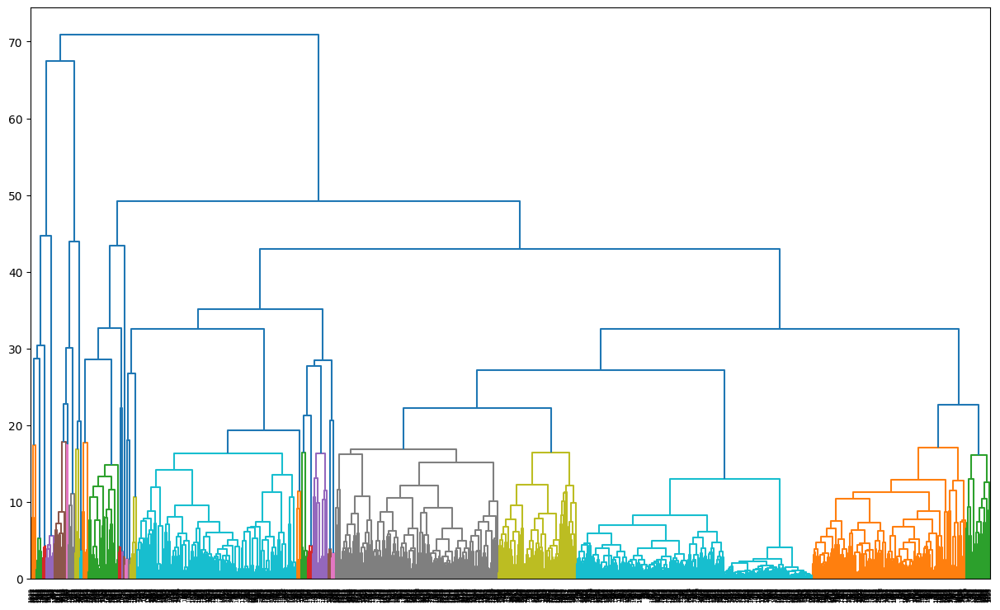

In [44]:
linked = plot_dendrogram(
    geek_df, # 사용할 데이터 프레임
    vector_col = 'vector', #군집을 위한 계산 대상이 되는 컬럼 선정
    method = 'ward', # 군집방식지정( 군집 내 분산을 최소화하는 방법)
    figsize = (15,9), # 시각화 크기 (가로,세로)
    orientation = 'top', # 덴드로그램 방향(위에서 아래로 그리기)

)

In [45]:
from new_value_analysis.actor_finder import agglomerative_silhouette_module

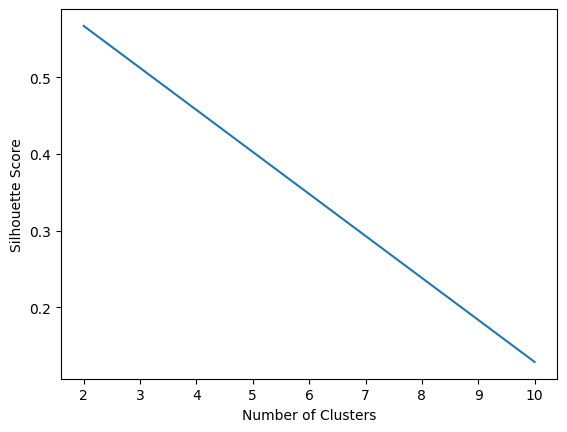

In [47]:
# 군집의 응집도와 분리도가 좋을 수록 1에 가까운 결과값이 나옴
# 특히 실루엣 계수의 변화폭이 큰 구간이 정보의 변화가 커서 해석하기 좋은 군집 수일 가능성이 높다 (엘보우 기법)
# 군집의 의미가 좋다라고 해석하는 건 별도로 텍스트 분석을 수행해야한다.
# 다이어그램과 실루엣계수 그래프르 복합적으로 보면서 시작 군집수를 설정하면 된다.

agglomerative_silhouette_module(
    geek_df, # 대상 DataFrame
    vector_col = 'vector', # 군집을 위한 계산 대상이 되는 컬럼 설정
    linkage = 'ward', # 군집방식지정 (군집 내 분산을 최소화하는 방향)
    n_cluster_range = (2,10), # 클러스터 개수별 실루엣 지수확인
)

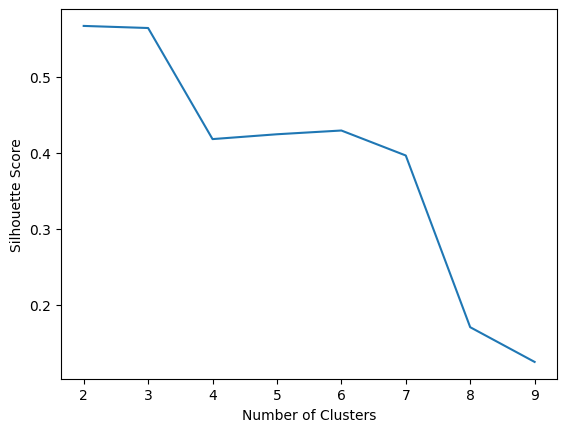

In [48]:
# 군집의 응집도와 분리도가 좋을 수록 1에 가까운 결과값이 나옴
# 특히 실루엣 계수의 변화폭이 큰 구간이 정보의 변화가 커서 해석하기 좋은 군집 수일 가능성이 높다 (엘보우 기법)
# 군집의 의미가 좋다라고 해석하는 건 별도로 텍스트 분석을 수행해야한다.
# 다이어그램과 실루엣계수 그래프르 복합적으로 보면서 시작 군집수를 설정하면 된다.

agglomerative_silhouette_module(
    geek_df, # 대상 DataFrame
    vector_col = 'vector', # 군집을 위한 계산 대상이 되는 컬럼 설정
    linkage = 'ward', # 군집방식지정 (군집 내 분산을 최소화하는 방향)
    # n_cluster_range = (2,10), # 클러스터 개수별 실루엣 지수확인
)

In [49]:
from new_value_analysis.actor_finder import visualize_silhouette

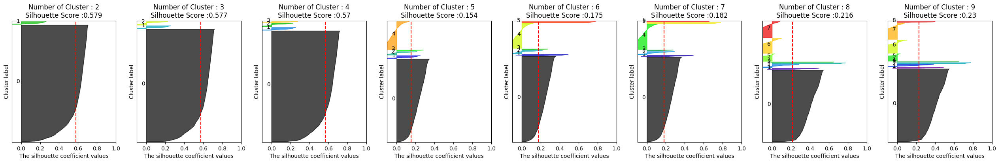

In [51]:
visualize_silhouette(range(2,10), # 시각화할 군집 수 범위설정
                     list(geek_df['vector']))

In [52]:
from sklearn.cluster import AgglomerativeClustering

In [53]:
# 군집도구 생성
cluster = AgglomerativeClustering(n_clusters = 3,  linkage = 'ward')

In [55]:
# 군집 수행
cluster_labels = cluster.fit_predict(list(geek_df['vector'])) # 일회용으로 사용할 것이기 때문에 학습부터 예측까지 한꺼번에 하는 fit_predict()함수 사용

In [57]:
# 새로운 열로 추가
geek_df['cluster'] = cluster_labels

In [58]:
all_document = [] # 각군집별 문서를 담기위한 리스트
for i in sorted(geek_df['cluster'].unique()): # 고유한 각 군집번호 만큼 반복
    # 각 클러스터별 문서 필터링(boolean indexing)
    pos_tagged = geek_df[geek_df['cluster']==i]['tagged_review'] # cluster 번호에 따른 tagged_review를 확인하고 싶음.
    #display(pos_tagged)

    #동일 클러스터에 있는 모든 단어토큰을 하나로 결함
    cluster_document = ""
    for doc in pos_tagged : # 군집별 모든 문서를 반복처리
        cluster_document += ' '.join(doc)

    all_document.append(cluster_document)

In [59]:
# c-tf-idf 계산 (class based tf-idf)
from sklearn.feature_extraction.text import TfidfVectorizer

In [61]:
# 도구 생성
AI_tfidf = TfidfVectorizer()

#step1 : 단어사전 구축

AI_tfidf.fit(all_document)
print("단어사전의 크기 확인 : ",len(AI_tfidf.vocabulary_))

#step2 : 각 단어별 중요도 계산
AI_tfidf_vectors = AI_tfidf.transform(all_document)
print(AI_tfidf_vectors)

단어사전의 크기 확인 :  13927
<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 20474 stored elements and shape (3, 13927)>
  Coords	Values
  (0, 0)	0.0003297454491451827
  (0, 1)	0.0006182727171472175
  (0, 2)	0.023102571562568543
  (0, 3)	0.0001236545434294435
  (0, 4)	0.000494618173717774
  (0, 5)	0.0008243636228629568
  (0, 6)	0.0001567374458833184
  (0, 7)	0.00025077991341330947
  (0, 8)	0.001598721948009848
  (0, 9)	0.00024344121772991087
  (0, 10)	0.007863151332676122
  (0, 11)	0.0020062393073064758
  (0, 12)	0.0001567374458833184
  (0, 14)	0.000247309086858887
  (0, 15)	0.09937270507734962
  (0, 16)	0.0002060909057157392
  (0, 17)	4.1218181143147835e-05
  (0, 18)	0.0001236545434294435
  (0, 19)	8.243636228629567e-05
  (0, 20)	0.0001236545434294435
  (0, 21)	8.243636228629567e-05
  (0, 22)	4.1218181143147835e-05
  (0, 23)	0.0003297454491451827
  (0, 24)	4.1218181143147835e-05
  (0, 25)	4.1218181143147835e-05
  :	:
  (2, 13849)	0.0009885431232952392
  (2, 13858)	0.000564881784

In [62]:
# 단어사전 추출
vocab = AI_tfidf.get_feature_names_out()
print(vocab)
len(vocab)

# tf-idf vector 추출
tfidf_array = AI_tfidf_vectors.toarray()
print(tfidf_array)

['가가' '가게' '가격' ... '힘를' '힘쓰다' '힙합']
[[3.29745449e-04 6.18272717e-04 2.31025716e-02 ... 4.12181811e-05
  4.12181811e-05 1.23654543e-04]
 [0.00000000e+00 0.00000000e+00 1.12706845e-02 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.42571357e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


In [63]:
# 데이터프레임 생성
AIgeek_df = pd.DataFrame(tfidf_array,columns=vocab).T
AIgeek_df.columns = ['군집0','군집1','군집2']
AIgeek_df

,군집0,군집1,군집2
가가,0.000330,0.000000,0.000000
가게,0.000618,0.000000,0.000000
가격,0.023103,0.011271,0.001426
가격표,0.000124,0.000000,0.000000
가계,0.000495,0.000000,0.000000
...,...,...,...
힘드다,0.000909,0.000000,0.000282
힘들다,0.001525,0.000000,0.000000
힘를,0.000041,0.000000,0.000000
힘쓰다,0.000041,0.000000,0.000000


In [64]:
# 군집별 정렬 후 파일로 저장
for col in AIgeek_df.columns : #컬럼이름 확보
    # 내림차순 정렬 후 상위 100개 확인
    temp_df = (AIgeek_df[col].sort_values(ascending = False).head(100))
    # 파일로 저장
    temp_df.to_csv(f'{col}.csv',encoding = 'euc-kr')

In [65]:
# 파일관리시스템
import os
from tqdm import tqdm
import pandas as pd

In [66]:
!pip install new_value_analysis

In [68]:
geek_df

,keyword,title,content,url,review_clean,tagged_review,vector,cluster
0,AI,AI로 개발을 어떻게 가속화 하는가 - 드디어 열린 입코딩 시대 [137p 구글 슬...,"프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 : ""코딩은 ...",https://news.hada.io/topic?id=22450,프로그래머로서 AI를 활용하는 방법\n생산성은 코딩에서만 오지 않는다 코딩은 일부...,"[프로그래머, 로서, 활용, 방법, 생산, 성은, 코딩, 오지, 않다, 코딩, 일부...","[-0.028123302, -0.35994872, -0.19015865, 0.071...",0
1,AI,Ask HN: AI에 지쳤어요. 다른 쿨한 기술들은 뭐가 있나요?,"""요즘 AI 뉴스가 대부분인데, 다른 종류의 혁신, 하드웨어, 네트워킹, 개발 도구...",https://news.hada.io/topic?id=21198,요즘 AI 뉴스가 대부분인데 다른 종류의 혁신 하드웨어 네트워킹 개발 도구 로봇 공...,"[요즘, 뉴스, 대부분, 종류, 혁신, 하드웨어, 네트워킹, 개발, 도구, 로봇, ...","[-0.5977394, 0.03211505, -0.32364494, 0.142447...",0
2,AI,AI 지원이 코딩 기술 형성에 미치는 영향,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,https://news.hada.io/topic?id=26275,앤트로픽이 AI 코딩 도우미를 사용하는게 개발자의 학습과 숙련도에 어떤 영향을 주는...,"[앤트로픽, 코딩, 도우미, 사용, 개발자, 학습, 숙련, 도, 영향, 주다, 실험...","[-0.17926887, -0.124107935, -0.35772273, -0.21...",0
3,AI,"두 가지 유형의 AI 사용자가 등장하고 있으며, 그 격차는 놀랍습니다","AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며, ‘파워 유저’ 는 Claud...",https://news.hada.io/topic?id=26345,AI 사용자 간 생산성 격차가 급격히 벌어지고 있으며 파워 유저 는 Claude C...,"[사용자, 간, 생산, 격차, 급격하다, 벌어지다, 파워, 유저, 늘다, 고급, 도...","[-0.29294163, -0.08492994, -0.30918953, 0.3182...",0
4,AI,AI TOP 100이 우리에게 남긴 것들,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,https://news.hada.io/topic?id=24957,총 상금 1억 5천만원으로 3천명이 겨뤘던 AI Top 100 경진대회용 시스템을 ...,"[총, 상금, 겨루다, 경진, 대회, 용, 시스템, 준비, 카카오, 멤버, 다양하다...","[-0.27470472, 0.036382742, -0.04806655, -0.374...",0
...,...,...,...,...,...,...,...,...
1918,workflow automation,AI 시대의 새로운 개발자 패턴들,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,https://news.hada.io/topic?id=21115,AI를 단순한 도구가 아닌 기반 기술로 다루는 개발 문화가 형성되고 있음\n기존의 ...,"[단순하다, 도구, 아니다, 기반, 기술, 다루다, 개발, 문화, 형성, 기존, 버...","[-0.7643675, -0.09423611, -0.3206475, -0.07746...",0
1919,workflow automation,"Airtable Apps,Automations,Sync 공개",스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n-...,https://news.hada.io/topic?id=2867,스프레드시트 기반 협업도구인 Airtable 을 LowCode 플랫폼으로 확장\n ...,"[스프레드시트, 기반, 협업, 도구, 플랫폼, 확장, 다양하다, 앱, 개발, 통해,...","[-0.035215087, -0.004060046, -0.041489646, -0....",0
1920,workflow automation,Microsoft Amplifier - 초고속 AI 개발 환경,"전문화된 AI 에이전트, 지속적인 지식의 축적, 복잡한 방법론을 실행하는 자동화 워...",https://news.hada.io/topic?id=23672,전문화된 AI 에이전트 지속적인 지식의 축적 복잡한 방법론을 실행하는 자동화 워크플...,"[전문화, 에이전트, 지속, 지식, 축적, 복잡하다, 방법론, 실행, 자동화, 워크...","[-0.13345644, -0.091784514, -0.2507462, -0.144...",0
1921,workflow automation,n8n - 오픈소스 워크플로우 자동화 솔루션,"- 150개 이상의 앱과 연동\n- Zapier, IFTTT처럼 No-Code 플로...",https://news.hada.io/topic?id=4056,150개 이상의 앱과 연동\n Zapier IFTTT처럼 NoCode 플로우 작성...,"[개, 앱, 연동, 처럼, 플로우, 작성, 운용, 조건, 부, 로직, 리, 퀘스트,...","[-0.011233934, 0.009050014, -0.013041461, -0.0...",0


In [69]:
# 군집 수 확인
print("0번 군집 : ",geek_df[geek_df['cluster']==0].shape)
print("0번 군집 : ",geek_df[geek_df['cluster']==1].shape)
print("0번 군집 : ",geek_df[geek_df['cluster']==2].shape)

0번 군집 :  (1820, 8)
0번 군집 :  (47, 8)
0번 군집 :  (55, 8)


In [70]:
geek_df_cluster0 = geek_df[geek_df['cluster']==0]

In [67]:
from gensim.corpora import Dictionary # 단어사전 구축용 도구

In [71]:
all_document = list(geek_df_cluster0['tagged_review'])
all_document

[['프로그래머',
  '로서',
  '활용',
  '방법',
  '생산',
  '성은',
  '코딩',
  '오지',
  '않다',
  '코딩',
  '일부분',
  '모든',
  '부분',
  '가다',
  '사용',
  '되어다',
  '회사',
  '전체',
  '빨르다',
  '짐',
  '리서치',
  '고민',
  '아웃소싱',
  '보다',
  '복잡하다',
  '주제',
  '대한',
  '조사',
  '고민',
  '늘다',
  '신입',
  '니',
  '거대하다',
  '프롬프트',
  '만들다',
  '코딩',
  '그렇다',
  '이제',
  '코딩',
  '해보다',
  '가다',
  '메인',
  '요즘',
  '늘다',
  '좋다',
  '도구',
  '쥐다',
  '느낌',
  '건',
  '여전하다',
  '좋다',
  '주니어',
  '붙이다',
  '느낌',
  '부리다',
  '이제',
  '가다',
  '제철',
  '함',
  '살피다',
  '보기',
  '예제',
  '작성',
  '미국',
  '주식',
  '개별',
  '종목',
  '투자',
  '도와주다',
  '프로그램',
  '만들기',
  '코딩',
  '작성자',
  '역전',
  '세계',
  '예전',
  '방식',
  '내',
  '짜다',
  '가다',
  '돕다',
  '코딩',
  '가다',
  '짜다',
  '내',
  '돕다',
  '이상하다',
  '짓',
  '관찰',
  '후',
  '원하다',
  '방향',
  '새',
  '룰',
  '추가',
  '룰',
  '개별',
  '프로젝트',
  '마다',
  '필요하다',
  '지식',
  '포함',
  '코드',
  '룰',
  '묶음',
  '자라나다',
  '룰',
  '지식',
  '팀',
  '레',
  '포지',
  '토리',
  '버전',
  '관리',
  '대상',
  '배우다',
  '팁',
  '아니다',
  '코드',
  '베이스',
  '개선',
  '작성'

In [72]:
word_dict = Dictionary(all_document)

In [73]:
print(word_dict)
print(word_dict.token2id)

Dictionary<12252 unique tokens: ['가다', '가장', '가져오다', '가치', '개']...>
{'가다': 0, '가장': 1, '가져오다': 2, '가치': 3, '개': 4, '개발': 5, '개발자': 6, '개별': 7, '개선': 8, '거대하다': 9, '건': 10, '계속': 11, '고민': 12, '공률': 13, '공부': 14, '과제': 15, '관리': 16, '관찰': 17, '그렇다': 18, '그름': 19, '끊임없다': 20, '남다': 21, '내': 22, '높다': 23, '느낌': 24, '늘다': 25, '니': 26, '다해': 27, '대상': 28, '대한': 29, '더': 30, '데이터': 31, '도구': 32, '도와주다': 33, '도울': 34, '도움': 35, '돕다': 36, '되어다': 37, '뒤': 38, '딕': 39, '띄우다': 40, '라면': 41, '란': 42, '람보르기니': 43, '레': 44, '로서': 45, '로컬': 46, '룰': 47, '리서치': 48, '마다': 49, '만': 50, '만들기': 51, '만들다': 52, '맞다': 53, '머신': 54, '멋지다': 55, '메인': 56, '명': 57, '모드': 58, '모든': 59, '묶음': 60, '문맥': 61, '문서': 62, '미국': 63, '받다': 64, '방법': 65, '방식': 66, '방향': 67, '배': 68, '배우다': 69, '버전': 70, '베이스': 71, '변화': 72, '별': 73, '병렬': 74, '보기': 75, '보다': 76, '보이스': 77, '복잡하다': 78, '부리다': 79, '부분': 80, '분석': 81, '분야': 82, '붙이다': 83, '브라우저': 84, '비': 85, '빨르다': 86, '사람': 87, '사실': 88, '사용': 89, '사이': 90, '살피다': 91, '상호작용

In [74]:
# 전체 문서에 적용
corpus = [word_dict.doc2bow(doc) for doc in all_document]

In [75]:
len(corpus)

1820

In [76]:
import gensim

In [77]:
topic_num = 3 #생성할 토픽 수 설정(임의로 설정)

In [78]:
ldamodel = gensim.models.ldamodel.LdaModel(
    corpus, #각 문서를 단어 빈도수로 표현한 데이터
    id2word = word_dict, # 단어사전 연결 필요.
    num_topics = topic_num, #설정할 토픽 수
    passes = 10, # 전체 corpus를 대상으로 몇번 반복할지 설정
    iterations = 20, #각 문서별로 재할당하는 횟수 설정 > 과대적합 방지를 위해 적당한 값 설정 중요
    random_state = 42
)

In [79]:
ldamodel.print_topics(num_words = 20)

[(0,
  '0.008*"가다" + 0.008*"기술" + 0.007*"함" + 0.007*"개발자" + 0.006*"수" + 0.006*"더" + 0.005*"늘다" + 0.005*"않다" + 0.005*"코드" + 0.005*"사용" + 0.004*"문제" + 0.004*"변화" + 0.004*"인간" + 0.004*"도구" + 0.004*"기업" + 0.004*"팀" + 0.004*"생산" + 0.004*"아니다" + 0.004*"엔지니어" + 0.004*"활용"'),
 (1,
  '0.017*"코드" + 0.011*"에이전트" + 0.009*"작업" + 0.009*"수" + 0.008*"사용" + 0.008*"함" + 0.008*"도구" + 0.007*"생" + 0.007*"가다" + 0.006*"개발자" + 0.006*"활용" + 0.006*"코딩" + 0.006*"개발" + 0.006*"늘다" + 0.005*"가능" + 0.005*"모델" + 0.005*"기능" + 0.005*"더" + 0.005*"작성" + 0.005*"테스트"'),
 (2,
  '0.012*"모델" + 0.012*"수" + 0.009*"데이터" + 0.009*"함" + 0.008*"기업" + 0.008*"늘다" + 0.006*"않다" + 0.006*"더" + 0.006*"기술" + 0.006*"가다" + 0.005*"시장" + 0.005*"아니다" + 0.005*"생" + 0.005*"제품" + 0.004*"없다" + 0.004*"비용" + 0.004*"많다" + 0.004*"사용" + 0.004*"실제" + 0.004*"임"')]

In [ ]:
# 특정문서에 할당된 토픽확인하기
corpus_topics = ldamodel.get_document_topics(corpus)

In [80]:
# coherence 사용해보기
from gensim.models import CoherenceModel

In [82]:
coherence_model = CoherenceModel(
    model = ldamodel, #평가할 모델
    texts = all_document, #토픽간 단어 관련성을 측정
    dictionary = word_dict, #단어사전
    topn = 10 # 토픽별로 상;위10개 단어만 측정
)

In [83]:
print("coherence 점수 : ",coherence_model.get_coherence())

coherence 점수 :  0.36234727606080747


In [84]:
from new_value_analysis.action_finder import lda_perplexity_coherence_plot

  0%|          | 0/8 [00:00<?, ?it/s]

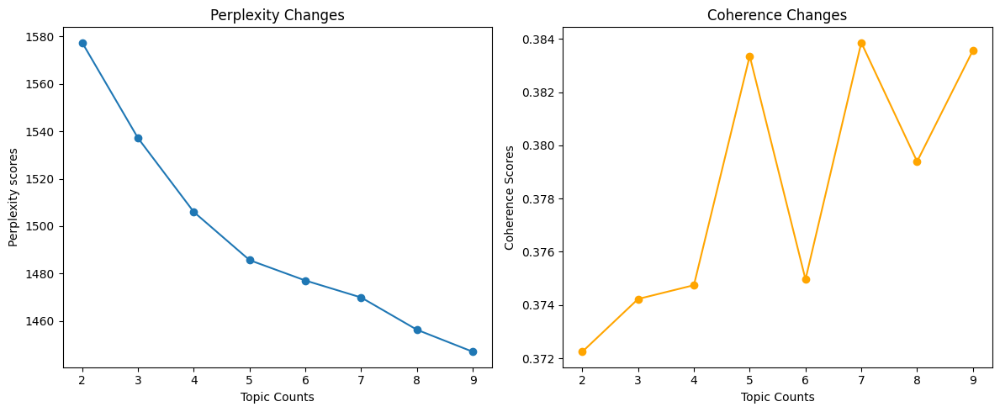

In [85]:
lda_perplexity_coherence_plot(
    corpus = corpus, #BOW 형태로 되어있는 말뭉치데이터
    word_dict = word_dict, #단어사전 넣기
    passes = 10, #전체 말뭉치 반복 횟수
    iterations = 20 , # 문서별 재할당 계산 횟수
    ## lda모델에 대한 기본 파라미터
    topic_range = range(2,10), # 토픽 개수 설정
    random_state = 2026,
    all_documents = all_document, #문서 리스트
    fixed_topn = 10 #상위단어 제한
)